In [1]:
# %install_ext https://raw.github.com/cpcloud/ipython-autotime/master/autotime.py
%load_ext autotime
import osmnx as ox, geopandas as gpd, pandas as pd, networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon, MultiPolygon, MultiPoint
from IPython.display import Image
from descartes import PolygonPatch
from itertools import combinations, combinations_with_replacement
%matplotlib inline
ox.config(log_console=False, use_cache=True)
%config IPCompleter.greedy=True
import contextily as ctx
import rasterio

time: 1.46 s (started: 2021-08-15 10:33:16 +02:00)


In [2]:
# in case of encountering problems with GEOS or GDAL, disable speedups from shapely
from shapely import speedups
speedups.disable()

time: 440 µs (started: 2021-08-15 10:33:18 +02:00)


Cologne coordinate reference system:  epsg:4326
Projected Cologne coordinate reference system:  +proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


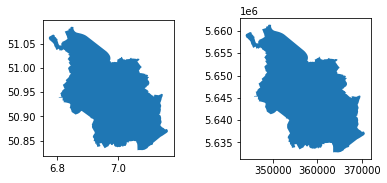

time: 490 ms (started: 2021-08-15 10:33:18 +02:00)


In [3]:
# load Milan city from openstreetmap using osmmnx api

city_name = 'Cologne, Germany'
city = ox.geocode_to_gdf(city_name)
print('Cologne coordinate reference system: ', city.crs)

# project to the local coordinate reference system
city_proj = ox.projection.project_gdf(city)
print('Projected Cologne coordinate reference system: ', city_proj.crs)

fig, (ax1, ax2) = plt.subplots(1, 2)
city.plot(ax=ax1, ec='none')
city_proj.plot(ax=ax2, ec='none' )
plt.tight_layout(pad=3.0)
plt.show()

In [4]:
# convert to "ESRI:54009" coordinate system, since that's the system NASA uses
city = city.to_crs("ESRI:54009") 
print(city.crs)

ESRI:54009
time: 240 ms (started: 2021-08-15 10:33:18 +02:00)


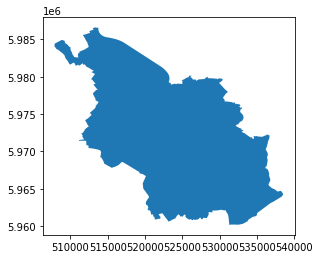

time: 140 ms (started: 2021-08-15 10:33:18 +02:00)


In [5]:
# plot city in new projection
ax = city.plot(ec='none')


In [6]:
# save to file
city.to_file('Cologne_54009.shp')

time: 90.2 ms (started: 2021-08-15 10:33:18 +02:00)


<ipython-input-6-3867eeae168c>:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  city.to_file('Cologne_54009.shp')


In [7]:
# load the saved file
import fiona
with fiona.open("Cologne_54009.shp", "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

time: 176 ms (started: 2021-08-15 10:33:19 +02:00)


In [8]:
# load the NASA population density raster file
# Data source: https://sedac.ciesin.columbia.edu/data/collection/gpw-v4
import rasterio.mask
with rasterio.open("data/GHS_POP_E2015_GLOBE_R2019A_54009_250_V1_0/GHS_POP_E2015_GLOBE_R2019A_54009_250_V1_0.tif") as src:
    # since the NASA data is for the entire world, we will use the 'shapes' polygon containing our city to mask out
    # the population raster data corresponding to our city
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True, nodata=0)
    out_meta = src.meta

time: 130 ms (started: 2021-08-15 10:33:19 +02:00)


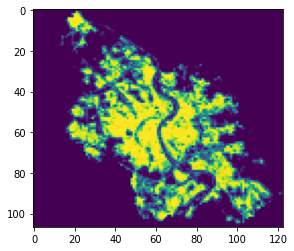

time: 110 ms (started: 2021-08-15 10:33:19 +02:00)


In [9]:
plt.imshow(out_image[0])

In [10]:
# since the raster array contains many dimensions, we assign the dimension containing the population density data to a new 
# variable
pop_density = out_image[0,:,:]
pop_density

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

time: 2.61 ms (started: 2021-08-15 10:33:19 +02:00)


In [11]:
# just in case, set all negative values to zero
pop_density[pop_density < 0] = 0

time: 2.49 ms (started: 2021-08-15 10:33:19 +02:00)


In [12]:
# split city into 400 x 400 meter grid cells
geometry = city_proj['geometry'].iloc[0]
print(type(geometry))
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width = 400)
print(type(geometry_cut))

<class 'shapely.geometry.polygon.Polygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
time: 20.2 s (started: 2021-08-15 10:33:19 +02:00)


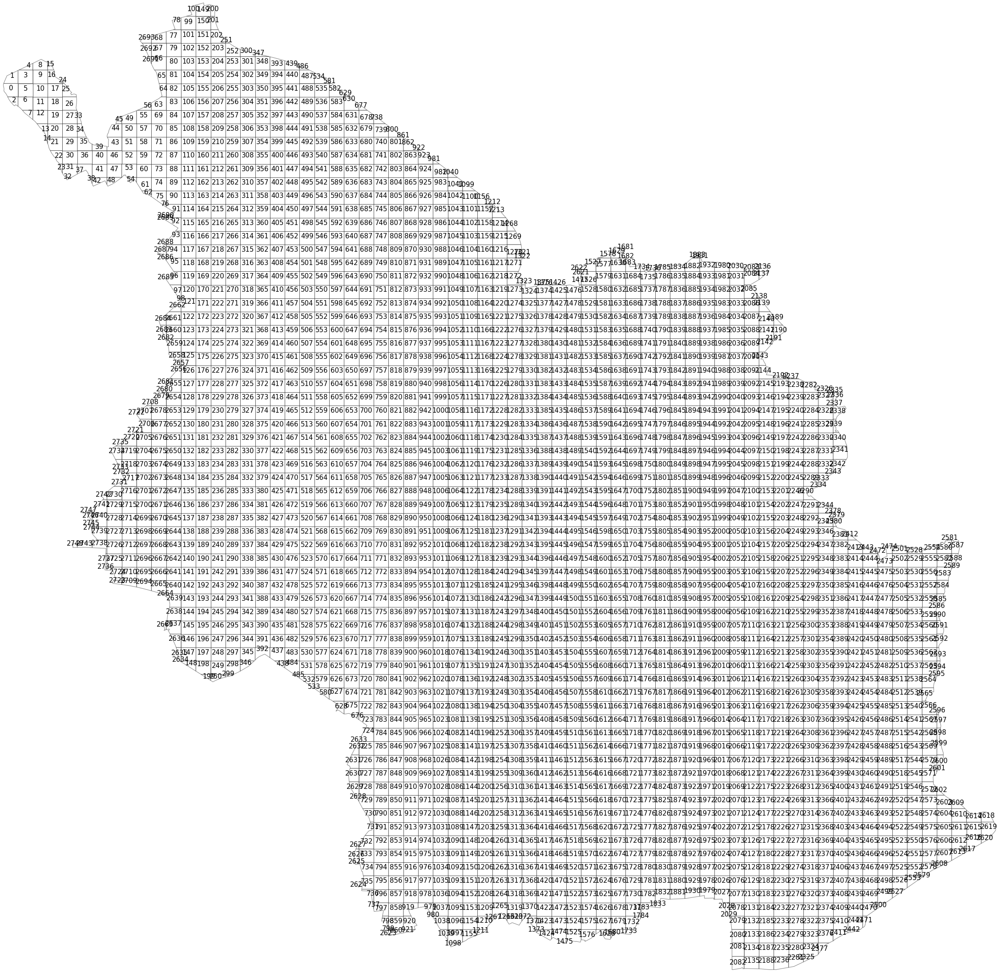

time: 13.2 s (started: 2021-08-15 10:33:39 +02:00)


In [13]:
polylist = [p for p in geometry_cut]

# plot city
west, south, east, north = city_proj.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=15)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [14]:
# create geodataframe from the square grid polygons
polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city_proj.crs
print(polyframe.crs)
polyframe.head()

+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((343914.677 5659037.268, 343917.321 5..."
1,"POLYGON ((343928.734 5659082.923, 343936.009 5..."
2,"POLYGON ((344314.074 5658684.065, 344314.074 5..."
3,"POLYGON ((344314.074 5659468.494, 344339.173 5..."
4,"POLYGON ((344339.173 5659481.782, 344437.658 5..."


time: 27.4 ms (started: 2021-08-15 10:33:52 +02:00)


<AxesSubplot:>

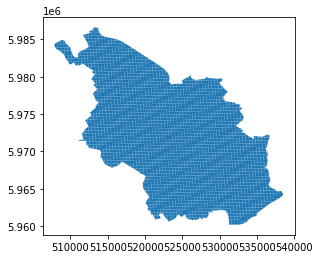

time: 967 ms (started: 2021-08-15 10:33:52 +02:00)


In [15]:
# convert to the NASA crs we introduced earlier
polyframe= polyframe.to_crs(city.crs)
polyframe.plot()

In [16]:
# load library for aggregating raster data into vector polygons
from rasterstats import zonal_stats

time: 56.5 ms (started: 2021-08-15 10:33:53 +02:00)


In [17]:
# compute the mean value of all raster values that fall into a given quadratic cell

affine = out_transform
city_stats = zonal_stats(polyframe, pop_density, affine=affine, stats='mean', nodata=0)
pop_array = np.array([list(item.values())[0] if list(item.values())[0] is not None else 0 for item in city_stats])
pop_array[:20]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 3.37492871, 0.        , 7.65532637, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ])

time: 2.64 s (started: 2021-08-15 10:33:53 +02:00)


In [18]:
city_stats[:10]

[{'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': 3.3749287128448486},
 {'mean': None},
 {'mean': 7.6553263664245605},
 {'mean': None}]

time: 2.37 ms (started: 2021-08-15 10:33:56 +02:00)


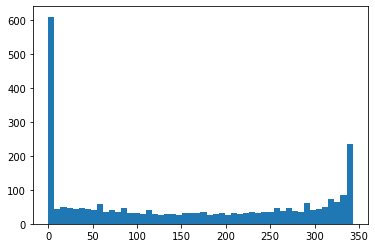

time: 168 ms (started: 2021-08-15 10:33:56 +02:00)


In [19]:
# plot histogram of the obtained population density values
plt.hist(pop_array, bins=50)
plt.show()

In [20]:
# assign the population values as a new column in the geodataframe with the grid cells, 
# so we know which grid cell has what population.

polyframe["population"] = pop_array
polyframe.head()

,geometry,population
0,"POLYGON ((507874.282 5984188.464, 507876.292 5...",0.0
1,"POLYGON ((507884.967 5984231.467, 507890.497 5...",0.0
2,"POLYGON ((508334.017 5983870.109, 508360.530 5...",0.0
3,"POLYGON ((508259.820 5984602.145, 508285.355 5...",0.0
4,"POLYGON ((508285.355 5984615.252, 508385.553 5...",0.0


time: 22.2 ms (started: 2021-08-15 10:33:56 +02:00)


(256, 4)
[[1.         0.96078431 0.94117647 1.        ]
 [0.99987697 0.95820069 0.93748558 1.        ]
 [0.99975394 0.95561707 0.93379469 1.        ]
 ...
 [0.41917724 0.00369089 0.05294887 1.        ]
 [0.4115494  0.00184544 0.05196463 1.        ]
 [0.40392157 0.         0.05098039 1.        ]]


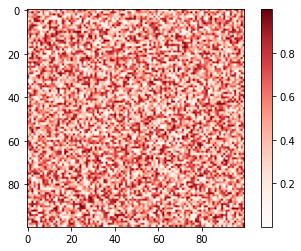

time: 199 ms (started: 2021-08-15 10:33:56 +02:00)


In [21]:
# in order to achieve a nice-looking visualisation, let's create a custom colormap, that fades away into transparency

ncolors = 256
# get cmap
color_array = plt.get_cmap('Reds')(range(ncolors))
print(color_array.shape)
print(color_array)

# change alpha values
color_array[:, -1] = np.linspace(0.3, 1, ncolors)

# create colormap object
import matplotlib.colors as colors
from matplotlib.colors import LinearSegmentedColormap

map_object = LinearSegmentedColormap.from_list(name="Reds_transp", colors=color_array)

# register the colormap object
plt.register_cmap(cmap=map_object)

# plot some example data
fig, ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100), cmap='Reds_transp')
plt.colorbar(mappable=h)

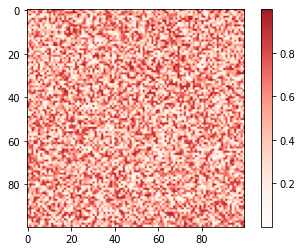

time: 164 ms (started: 2021-08-15 10:33:56 +02:00)


In [22]:
# let's cut it at the top for a better visual impact

def trunc_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = LinearSegmentedColormap.from_list('trunc({n}, {a:.2f}, {b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
                                                cmap(np.linspace(minval, maxval, n)))
    return new_cmap

cmap = plt.get_cmap('Reds_transp')
new_cmap = trunc_colormap(cmap, 0.0, .9)

# plot some example data
fig, ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100), cmap=new_cmap)
plt.colorbar(mappable=h)

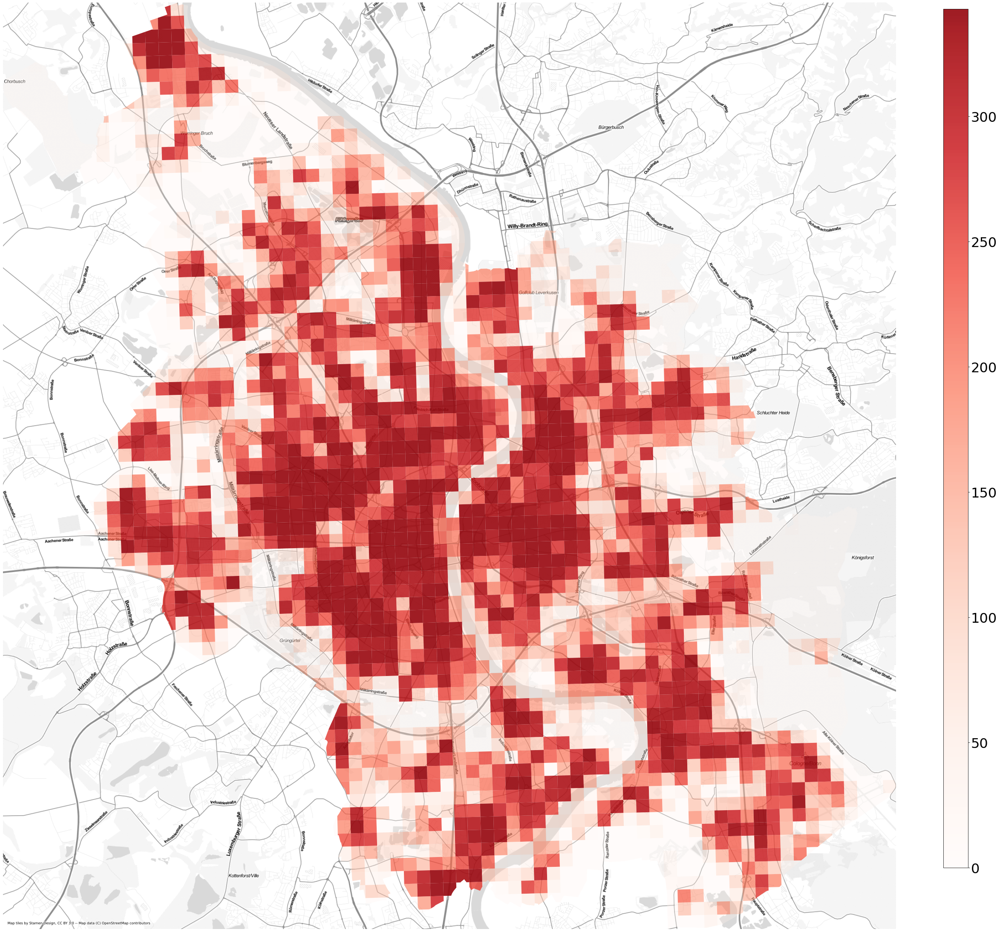

time: 21.2 s (started: 2021-08-15 10:33:57 +02:00)


In [23]:
# plot the population density data on a map background
plt.rcParams.update({'font.size':32})
import contextily as ctx
# ctx uses epsg:3857
polyframe_3857 = polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

#ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
fig, ax = plt.subplots(figsize=(40,40))
polyframe_3857.plot(ax=ax, column = 'population', legend=False, cmap=new_cmap)

cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap=new_cmap, \
                          norm = plt.Normalize(vmin=min(polyframe_3857.population), vmax=max(polyframe_3857.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

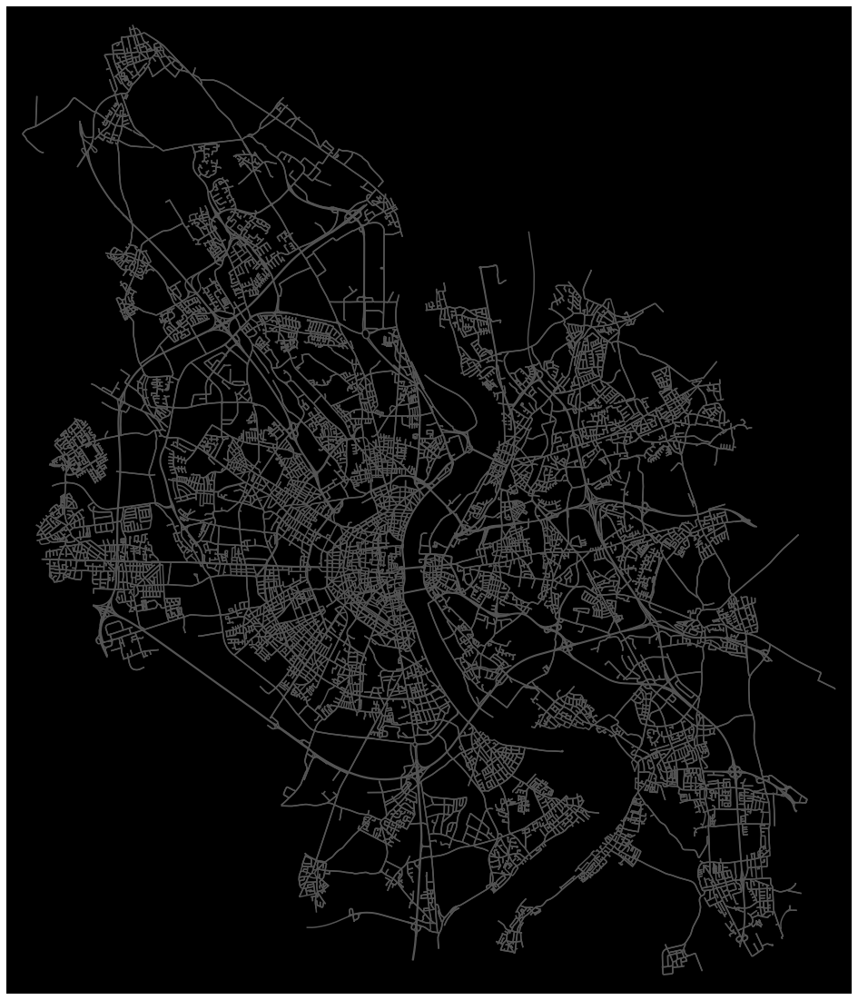

time: 29.9 s (started: 2021-08-15 10:34:18 +02:00)


In [24]:
# download and project a street network
G = ox.graph_from_place(city_name, network_type="drive")
#G = ox.project_graph(G)
fig, ax = ox.plot_graph(G, figsize=(20,20), bgcolor='k', node_size=0, node_color='#999999', node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=1.5, edge_alpha=1)

In [25]:
# set new coordinate reference system
from pyproj import CRS
crs = CRS.from_epsg(4326)
polyframe_gps = polyframe.to_crs(crs)
print(polyframe_gps.crs)

epsg:4326
time: 424 ms (started: 2021-08-15 10:34:48 +02:00)


<ipython-input-26-0e3ed00070c8>:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


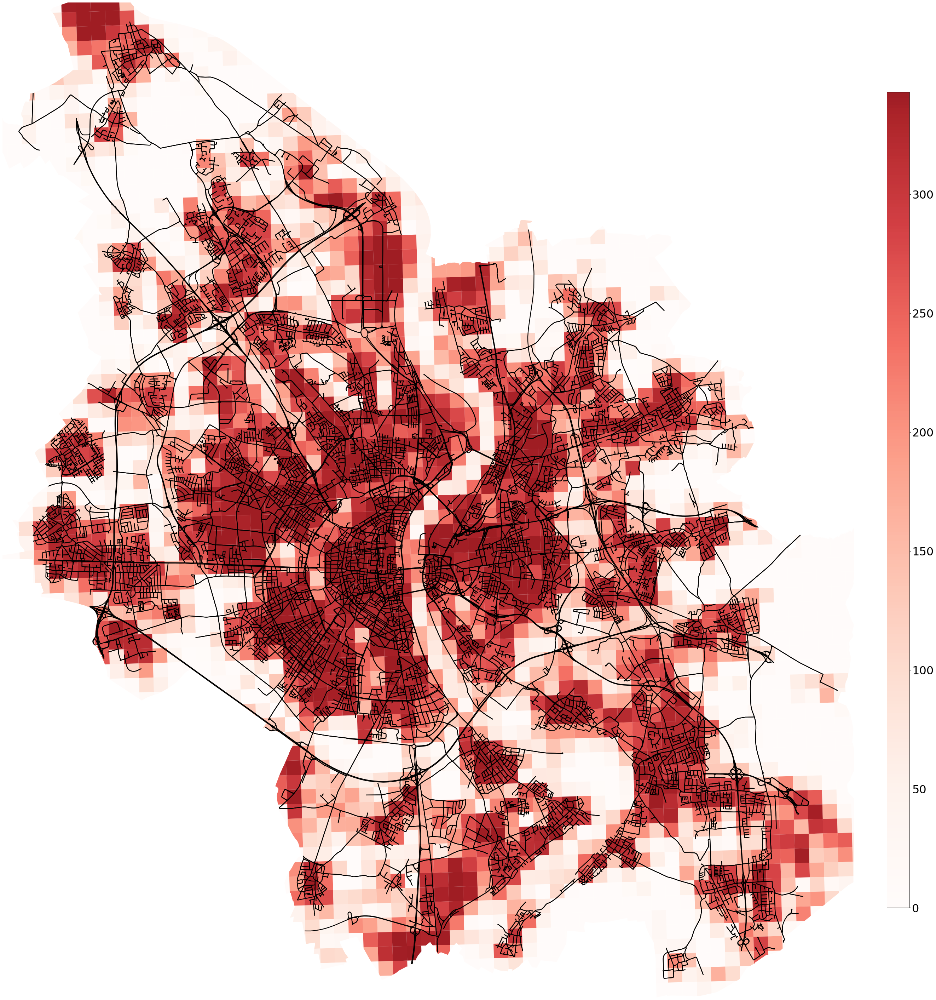

time: 6.85 s (started: 2021-08-15 10:34:48 +02:00)


In [26]:
fig, ax = plt.subplots(figsize=(40,40))

#plt.close()
polyframe_gps.plot(ax=ax, column = 'population', legend=False, cmap=new_cmap)

ox.plot_graph(G, ax=ax, figsize=(40,40),show=False, close=False, \
              node_color='grey', node_size=0, edge_linewidth=2.25, node_alpha=0.8, node_zorder=10,
              edge_color='black')

cbax = fig.add_axes([0.95, 0.1, 0.0225, 0.8])

sm = plt.cm.ScalarMappable(cmap=new_cmap, \
                          norm = plt.Normalize(vmin=min(polyframe_gps.population), vmax=max(polyframe_gps.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ax.axis('off')
plt.tight_layout()
#plt.savefig('../data/Milan_pop_density_with_streets.jpg', dpi=150)
plt.show()

In [27]:
# let's get a list containing the street network node IDs
graph = G.nodes(data=True)
nodelist = [x[0] for x in graph]
nodelist[:10]

[160068,
 160072,
 160075,
 160086,
 160094,
 160116,
 160120,
 160123,
 160124,
 160144]

time: 3.95 ms (started: 2021-08-15 10:34:55 +02:00)


In [28]:
# then, we create a dataframe containing features of the street nodes (junctions)
from tqdm import tqdm
street_dict = {'osmid':[], 'lon':[], 'lat':[], 'street_count':[]}
for node in tqdm(nodelist):
    street_dict['osmid'].append(node)
    street_dict['lon'].append(graph[node]['x'])
    street_dict['lat'].append(graph[node]['y'])
    street_dict['street_count'].append(graph[node]['street_count'])
    
street_frame = pd.DataFrame(street_dict)
street_frame.head(10)

100%|██████████| 16275/16275 [00:00<00:00, 312284.63it/s]


,osmid,lon,lat,street_count
0,160068,6.911179,50.897751,3
1,160072,6.910485,50.899408,3
2,160075,6.915456,50.904184,4
3,160086,6.925887,50.892731,3
4,160094,6.923768,50.888294,3
5,160116,6.850088,50.924537,3
6,160120,6.846109,50.926918,3
7,160123,6.847450,50.928958,3
8,160124,6.847237,50.929053,3
9,160144,6.842774,50.922009,3


time: 382 ms (started: 2021-08-15 10:34:55 +02:00)


In [29]:
# let's create Point geometries from the lat, lon pairs. 
geometry = [Point(xy) for xy in zip(street_frame.lon, street_frame.lat)]
street_frame = street_frame.drop(['lon', 'lat'], axis=1)
gdf = gpd.GeoDataFrame(street_frame, crs=crs, geometry=geometry)
gdf.tail()

,osmid,street_count,geometry
16270,8903645861,1,POINT (6.82783 50.95394)
16271,8912286420,3,POINT (7.10189 50.92046)
16272,8922344914,3,POINT (6.97563 50.94273)
16273,8926792901,1,POINT (6.88567 51.03782)
16274,8936530138,1,POINT (6.88896 51.03148)


time: 369 ms (started: 2021-08-15 10:34:55 +02:00)


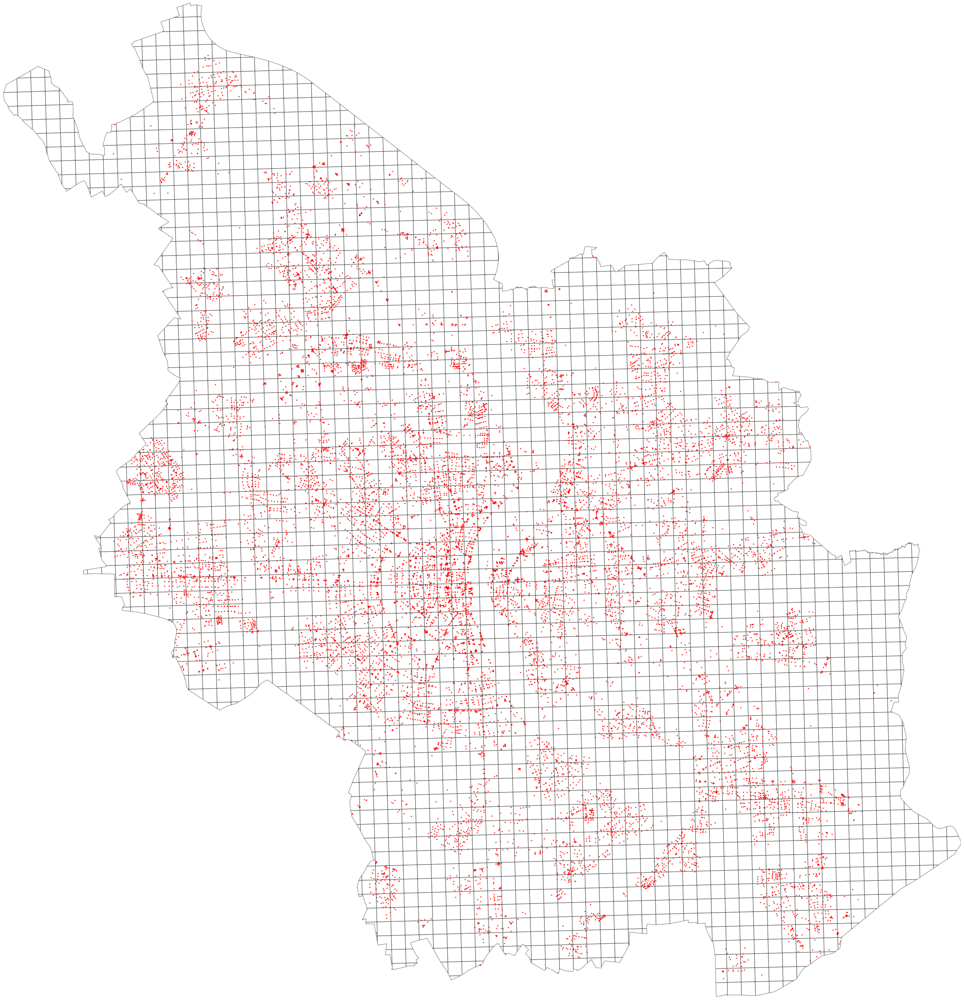

time: 4.76 s (started: 2021-08-15 10:34:56 +02:00)


In [30]:
west, south, east, north = polyframe_gps.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(polyframe_gps.geometry, np.arange(len(polyframe_gps))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5)
    ax.add_patch(patch)
#     plt.annotate(s=n, xy=p,
#                  horizontalalignment='center', size=7)
gdf.plot(ax=ax, color='red', markersize=2, zorder=2)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [31]:
pointInPoly = gpd.sjoin(polyframe_gps, gdf, op='contains')
print(len(pointInPoly))
pointInPoly.head(10)

16274


,geometry,population,index_right,osmid,street_count
43,"POLYGON ((6.81317 51.04589, 6.81325 51.04586, ...",51.812013,5249,260758089,3
53,"POLYGON ((6.82478 51.04149, 6.82494 51.03790, ...",0.000000,3993,249755149,3
69,"POLYGON ((6.83549 51.05603, 6.83566 51.05245, ...",57.324398,5250,260758092,3
71,"POLYGON ((6.83583 51.04887, 6.83600 51.04528, ...",87.599976,4298,255079701,3
71,"POLYGON ((6.83583 51.04887, 6.83600 51.04528, ...",87.599976,4299,255079702,3
74,"POLYGON ((6.83633 51.03811, 6.83650 51.03453, ...",28.865244,4032,250584669,3
85,"POLYGON ((6.84136 51.05256, 6.84152 51.04897, ...",0.000000,4037,250584695,3
85,"POLYGON ((6.84136 51.05256, 6.84152 51.04897, ...",0.000000,4036,250584693,3
85,"POLYGON ((6.84136 51.05256, 6.84152 51.04897, ...",0.000000,10322,672849140,3
85,"POLYGON ((6.84136 51.05256, 6.84152 51.04897, ...",0.000000,4038,250584696,3


time: 778 ms (started: 2021-08-15 10:35:01 +02:00)


In [32]:
streetcounts = pointInPoly.groupby(pointInPoly.index)['index_right'].count()
counts = pd.DataFrame(streetcounts)
counts.columns = ['counts']
counts

,counts
43,1
53,1
69,1
71,2
74,1
...,...
2728,11
2729,12
2733,1
2739,2


time: 7.17 ms (started: 2021-08-15 10:35:01 +02:00)


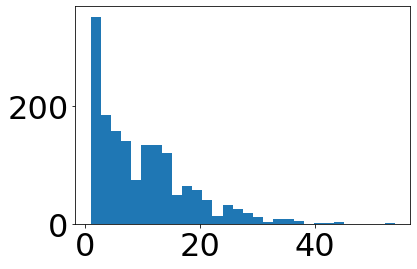

time: 111 ms (started: 2021-08-15 10:35:01 +02:00)


In [33]:
# a quick histogram of the street node counts
plt.hist(counts.counts, bins=30)
plt.show()

In [34]:
polycounts = polyframe_gps.copy()
polycounts['counts'] = counts.counts
polycounts['counts'].fillna(0, inplace=True)
polycounts['counts'] = polycounts['counts'].astype(int)
polycounts

,geometry,population,counts
0,"POLYGON ((6.77253 51.06162, 6.77256 51.06169, ...",0.0,0
1,"POLYGON ((6.77271 51.06203, 6.77280 51.06224, ...",0.0,0
2,"POLYGON ((6.77838 51.05855, 6.77850 51.05603, ...",0.0,0
3,"POLYGON ((6.77804 51.06560, 6.77839 51.06572, ...",0.0,0
4,"POLYGON ((6.77839 51.06572, 6.77977 51.06622, ...",0.0,0
...,...,...,...
2744,"POLYGON ((6.81232 50.94303, 6.81219 50.94331, ...",0.0,0
2745,"POLYGON ((6.81173 50.94439, 6.81135 50.94524, ...",0.0,0
2746,"POLYGON ((6.81219 50.94580, 6.81008 50.94794, ...",0.0,0
2747,"POLYGON ((6.81008 50.94794, 6.80954 50.94849, ...",0.0,0


time: 113 ms (started: 2021-08-15 10:35:01 +02:00)


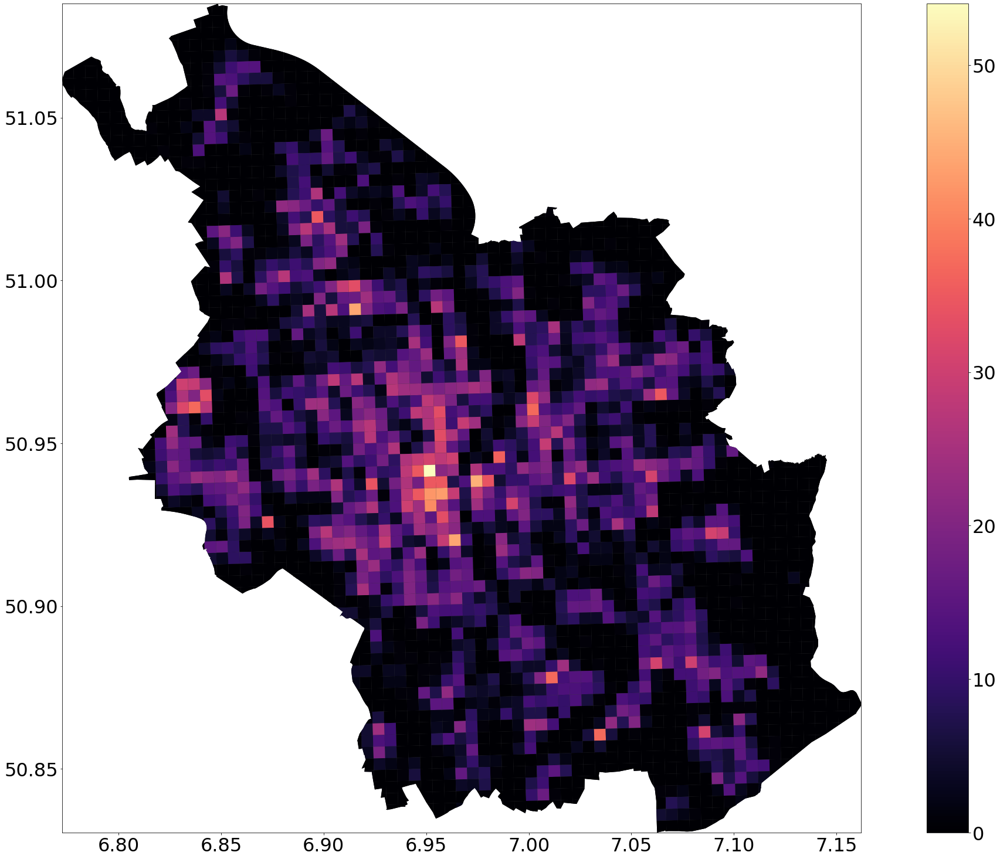

time: 1.82 s (started: 2021-08-15 10:35:02 +02:00)


In [35]:
# plot the city street network density
west, south, east, north = polycounts.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polycounts.plot(column='counts',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

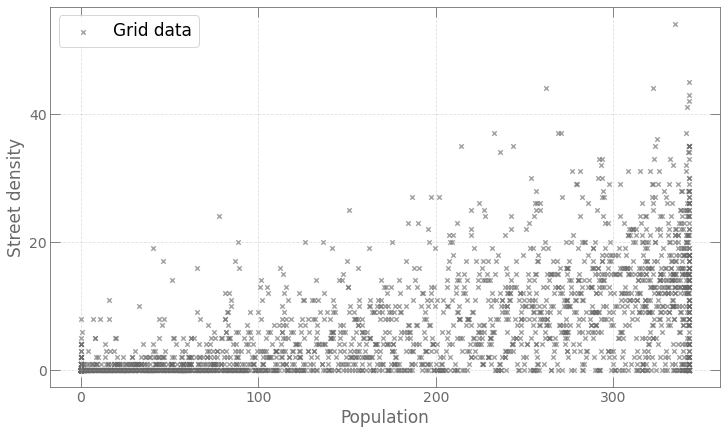

time: 160 ms (started: 2021-08-15 10:35:03 +02:00)


In [36]:
fig, ax = plt.subplots(figsize=(12, 7))
ax.scatter(polycounts.population, polycounts.counts, alpha=0.6, color='dimgrey',\
           zorder=1, marker='x', label = "Grid data", s=20)

ax.legend(prop={'size': 17})
plt.xlabel('Population', size=17, color='dimgrey')
plt.ylabel('Street density', size=17, color='dimgrey', rotation=90)

ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')
ax.tick_params(direction="in", size=10)
ax.spines['bottom'].set_color('dimgrey')
ax.spines['top'].set_color('dimgrey') 
ax.spines['right'].set_color('dimgrey')
ax.spines['left'].set_color('dimgrey')
ax.tick_params(axis='x', colors='dimgrey')
ax.tick_params(axis='y', colors='dimgrey')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
ax.grid(alpha=0.4,ls='--')
# plt.savefig('pop_dens_milan.jpg', dpi=120)
plt.show()

In [37]:
np.corrcoef(polycounts.population,polycounts.counts)

array([[1.        , 0.66278927],
       [0.66278927, 1.        ]])

time: 2.39 ms (started: 2021-08-15 10:35:04 +02:00)


In [38]:
import pandana

time: 5.48 ms (started: 2021-08-15 10:35:04 +02:00)


In [39]:
from pandana.loaders import osm

import warnings
warnings.filterwarnings('ignore')

time: 1.32 ms (started: 2021-08-15 10:35:04 +02:00)


In [40]:
# get bounding box of city first
west, south, east, north = polycounts.unary_union.bounds
print(west, south, east, north)

6.772530300000001 50.830439899999995 7.162028 51.0849743
time: 366 ms (started: 2021-08-15 10:35:04 +02:00)


In [41]:
network = osm.pdna_network_from_bbox(south, west, north, east)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](50.83043990,6.77253030,51.08497430,7.16202800);>;);out;'}"
Downloaded 73,113.3KB from www.overpass-api.de in 9.43 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 11.16 seconds
Returning OSM data with 469,633 nodes and 118,387 ways...
Edge node pairs completed. Took 94.97 seconds
Returning processed graph with 146,369 nodes and 202,374 edges...
Completed OSM data download and Pandana node and edge table creation in 113.70 seconds
time: 2min (started: 2021-08-15 10:35:04 +02:00)


In [42]:
network.nodes_df.head()

,x,y
id,,
160072,6.910485,50.899408
160074,6.912005,50.900917
160075,6.915456,50.904184
160086,6.925887,50.892731
160094,6.923768,50.888294


time: 4.47 ms (started: 2021-08-15 10:37:05 +02:00)


In [43]:
network.edges_df.head()

,,from,to,distance
160072,850614651,160072,850614651,29.078185
160074,4444605903,160074,4444605903,43.623693
160075,6250044484,160075,6250044484,36.261545
160086,4517270483,160086,4517270483,77.100521
160094,1556009102,160094,1556009102,17.145909


time: 7.22 ms (started: 2021-08-15 10:37:05 +02:00)


In [44]:
restaurants = osm.node_query(
    south, west, north, east, tags='"amenity"="restaurant"')

time: 783 ms (started: 2021-08-15 10:37:05 +02:00)


In [45]:
restaurants.head()

,lat,lon,amenity,name,wheelchair,addr:city,addr:country,addr:housenumber,addr:postcode,addr:street,...,lunch:menu,building,building:use,operator:note,image,payment:bancomat,contact:instagram,diet:lactose_free,phone:mobile,phone_1
id,,,,,,,,,,,,,,,,,,,,,
359832,50.905156,6.963755,restaurant,Campus,yes,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
55441368,50.940398,7.006490,restaurant,Blauer König,limited,Köln,DE,24,51103,Markt,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
175667464,50.955028,6.925139,restaurant,Haus Eichendorf,no,Köln,NaN,69,50823,Ottostraße,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
175671817,50.955869,6.922805,restaurant,Carls,limited,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
175672191,50.956065,6.922249,restaurant,Miyu,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


time: 16.1 ms (started: 2021-08-15 10:37:06 +02:00)


In [46]:
restaurant_nodes = network.get_node_ids(restaurants.lon, restaurants.lat)
network.set(restaurant_nodes, 
            name = 'restaurants')

time: 29 ms (started: 2021-08-15 10:37:06 +02:00)


In [47]:
accessibility = network.aggregate(distance = 500,
                                  type = 'count',
                                  name = 'restaurants')
accessibility.describe()

count    146369.000000
mean          2.911429
std           9.040243
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         111.000000
dtype: float64

time: 655 ms (started: 2021-08-15 10:37:06 +02:00)


In [48]:
accessibility.head()

id
160072    0.0
160074    0.0
160075    0.0
160086    0.0
160094    0.0
dtype: float64

time: 3.19 ms (started: 2021-08-15 10:37:06 +02:00)


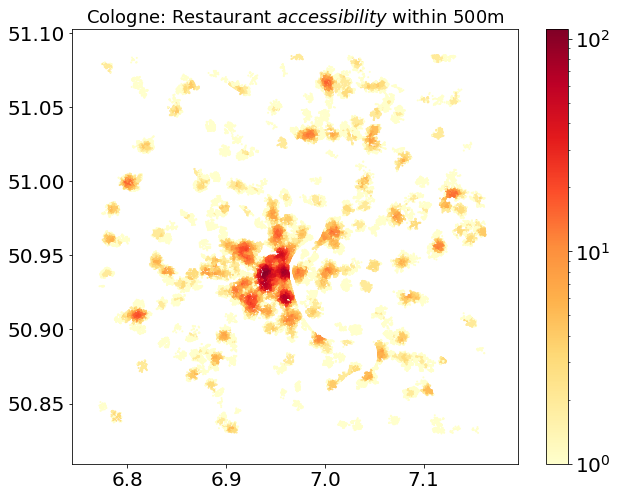

time: 1.6 s (started: 2021-08-15 10:37:06 +02:00)


In [49]:

import matplotlib
plt.rcParams.update({'font.size':20})
fig, ax = plt.subplots(figsize=(10,8))

plt.title('Cologne: Restaurant $accessibility$ within 500m', size = 18)
plt.scatter(network.nodes_df.x, network.nodes_df.y, 
            c=accessibility, s=1, cmap='YlOrRd', 
            norm=matplotlib.colors.LogNorm())
cb = plt.colorbar()

plt.show()

In [50]:
network_nodes = network.nodes_df
network_nodes.head()

,x,y
id,,
160072,6.910485,50.899408
160074,6.912005,50.900917
160075,6.915456,50.904184
160086,6.925887,50.892731
160094,6.923768,50.888294


time: 5.16 ms (started: 2021-08-15 10:37:08 +02:00)


In [51]:
network_nodes['accessibility'] = accessibility
network_nodes.head()

,x,y,accessibility
id,,,
160072,6.910485,50.899408,0.0
160074,6.912005,50.900917,0.0
160075,6.915456,50.904184,0.0
160086,6.925887,50.892731,0.0
160094,6.923768,50.888294,0.0


time: 7.73 ms (started: 2021-08-15 10:37:08 +02:00)


In [52]:
geometry = [Point(xy) for xy in zip(network_nodes.x, network_nodes.y)]
network_nodes = network_nodes.drop(['x', 'y'], axis=1)
network_gdf = gpd.GeoDataFrame(network_nodes, crs=crs, geometry=geometry)
network_gdf.head()

,accessibility,geometry
id,,
160072,0.0,POINT (6.91049 50.89941)
160074,0.0,POINT (6.91200 50.90092)
160075,0.0,POINT (6.91546 50.90418)
160086,0.0,POINT (6.92589 50.89273)
160094,0.0,POINT (6.92377 50.88829)


time: 3.27 s (started: 2021-08-15 10:37:08 +02:00)


In [53]:
len(network_gdf)

146369

time: 1.49 ms (started: 2021-08-15 10:37:11 +02:00)


In [54]:
pointInPoly = gpd.sjoin(polyframe_gps, network_gdf, op='contains')

time: 3.75 s (started: 2021-08-15 10:37:11 +02:00)


In [55]:

print(len(pointInPoly))
pointInPoly.head(10)

94569


,geometry,population,index_right,accessibility
0,"POLYGON ((6.77253 51.06162, 6.77256 51.06169, ...",0.0,287923048,0.0
0,"POLYGON ((6.77253 51.06162, 6.77256 51.06169, ...",0.0,364883896,0.0
0,"POLYGON ((6.77253 51.06162, 6.77256 51.06169, ...",0.0,4552596437,0.0
0,"POLYGON ((6.77253 51.06162, 6.77256 51.06169, ...",0.0,4552596616,0.0
0,"POLYGON ((6.77253 51.06162, 6.77256 51.06169, ...",0.0,4552596613,0.0
0,"POLYGON ((6.77253 51.06162, 6.77256 51.06169, ...",0.0,2201598595,0.0
2,"POLYGON ((6.77838 51.05855, 6.77850 51.05603, ...",0.0,626963590,0.0
2,"POLYGON ((6.77838 51.05855, 6.77850 51.05603, ...",0.0,2283386346,0.0
2,"POLYGON ((6.77838 51.05855, 6.77850 51.05603, ...",0.0,4552596627,0.0
2,"POLYGON ((6.77838 51.05855, 6.77850 51.05603, ...",0.0,4552596624,0.0


time: 22.8 ms (started: 2021-08-15 10:37:15 +02:00)


In [69]:
aggr_access = pointInPoly.groupby(pointInPoly.index)['accessibility'].mean()
aggr_access_df = pd.DataFrame(aggr_access)
aggr_access_df.columns = ['aggr_access']
aggr_access_df.max()

aggr_access    91.268657
dtype: float64

time: 8.46 ms (started: 2021-08-15 10:41:39 +02:00)


In [68]:
aggr_access_df.value_counts()

aggr_access
0.000000       1407
1.000000         41
0.333333         10
2.000000          9
0.200000          9
               ... 
0.916667          1
0.923913          1
0.924051          1
0.925926          1
91.268657         1
Length: 875, dtype: int64

time: 6.48 ms (started: 2021-08-15 10:41:28 +02:00)


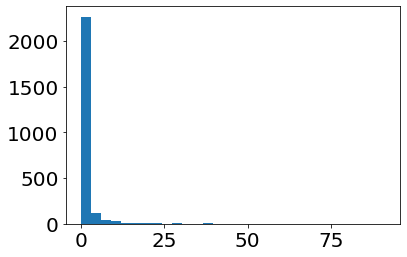

time: 159 ms (started: 2021-08-15 10:41:46 +02:00)


In [70]:
# a quick histogram of the aggregated accessibility
plt.hist(aggr_access_df.aggr_access, bins=30)
plt.show()

In [71]:
polyaccess = polyframe_gps.copy()
polyaccess['aggr_access'] = aggr_access_df.aggr_access
polyaccess['aggr_access'].fillna(0, inplace=True)
#polyaccess['aggr_access'] = polyaccess['aggr_access'].astype(int)
polyaccess

,geometry,population,aggr_access
0,"POLYGON ((6.77253 51.06162, 6.77256 51.06169, ...",0.0,0.0
1,"POLYGON ((6.77271 51.06203, 6.77280 51.06224, ...",0.0,0.0
2,"POLYGON ((6.77838 51.05855, 6.77850 51.05603, ...",0.0,0.0
3,"POLYGON ((6.77804 51.06560, 6.77839 51.06572, ...",0.0,0.0
4,"POLYGON ((6.77839 51.06572, 6.77977 51.06622, ...",0.0,0.0
...,...,...,...
2744,"POLYGON ((6.81232 50.94303, 6.81219 50.94331, ...",0.0,0.0
2745,"POLYGON ((6.81173 50.94439, 6.81135 50.94524, ...",0.0,0.0
2746,"POLYGON ((6.81219 50.94580, 6.81008 50.94794, ...",0.0,0.0
2747,"POLYGON ((6.81008 50.94794, 6.80954 50.94849, ...",0.0,0.0


time: 124 ms (started: 2021-08-15 10:41:59 +02:00)


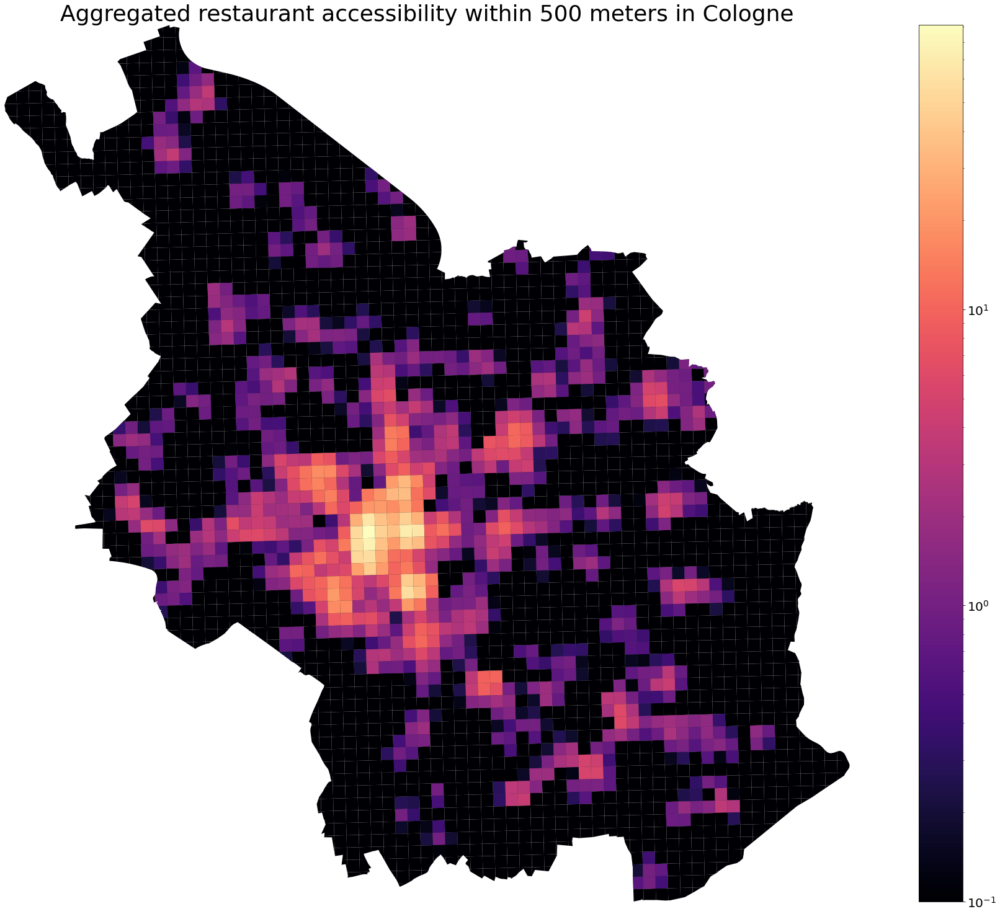

time: 2.33 s (started: 2021-08-15 10:42:08 +02:00)


In [72]:
# plot the city aggregated accessibility

LOGMIN = 0.1  # arbitrary lower bound, as appropriate for log-scaled data display
west, south, east, north = polyaccess.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polyaccess.plot(column='aggr_access',  legend=True, \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.aggr_access.min(), LOGMIN), \
                                   vmax=polyaccess.aggr_access.max()), \
                                    cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.title("Aggregated restaurant accessibility within 500 meters in Cologne", size = 36)
ax.axis('off')
plt.show()

In [73]:
polyaccess["pop_int"] = polyaccess.population.astype(int) + 1
polyaccess.head()

,geometry,population,aggr_access,pop_int
0,"POLYGON ((6.77253 51.06162, 6.77256 51.06169, ...",0.0,0.0,1
1,"POLYGON ((6.77271 51.06203, 6.77280 51.06224, ...",0.0,0.0,1
2,"POLYGON ((6.77838 51.05855, 6.77850 51.05603, ...",0.0,0.0,1
3,"POLYGON ((6.77804 51.06560, 6.77839 51.06572, ...",0.0,0.0,1
4,"POLYGON ((6.77839 51.06572, 6.77977 51.06622, ...",0.0,0.0,1


time: 27 ms (started: 2021-08-15 10:42:15 +02:00)


In [74]:
polyaccess["access_normalised"] = polyaccess.aggr_access / polyaccess.pop_int 
polyaccess.head(200)

,geometry,population,aggr_access,pop_int,access_normalised
0,"POLYGON ((6.77253 51.06162, 6.77256 51.06169, ...",0.000000,0.000000,1,0.00000
1,"POLYGON ((6.77271 51.06203, 6.77280 51.06224, ...",0.000000,0.000000,1,0.00000
2,"POLYGON ((6.77838 51.05855, 6.77850 51.05603, ...",0.000000,0.000000,1,0.00000
3,"POLYGON ((6.77804 51.06560, 6.77839 51.06572, ...",0.000000,0.000000,1,0.00000
4,"POLYGON ((6.77839 51.06572, 6.77977 51.06622, ...",0.000000,0.000000,1,0.00000
...,...,...,...,...,...
195,"POLYGON ((6.85886 50.92015, 6.85902 50.91657, ...",320.179189,0.561644,321,0.00175
196,"POLYGON ((6.85902 50.91657, 6.85919 50.91298, ...",314.557068,0.000000,315,0.00000
197,"POLYGON ((6.85919 50.91298, 6.85935 50.90940, ...",110.056969,0.000000,111,0.00000
198,"POLYGON ((6.85935 50.90940, 6.85951 50.90581, ...",11.606462,0.000000,12,0.00000


time: 124 ms (started: 2021-08-15 10:42:17 +02:00)


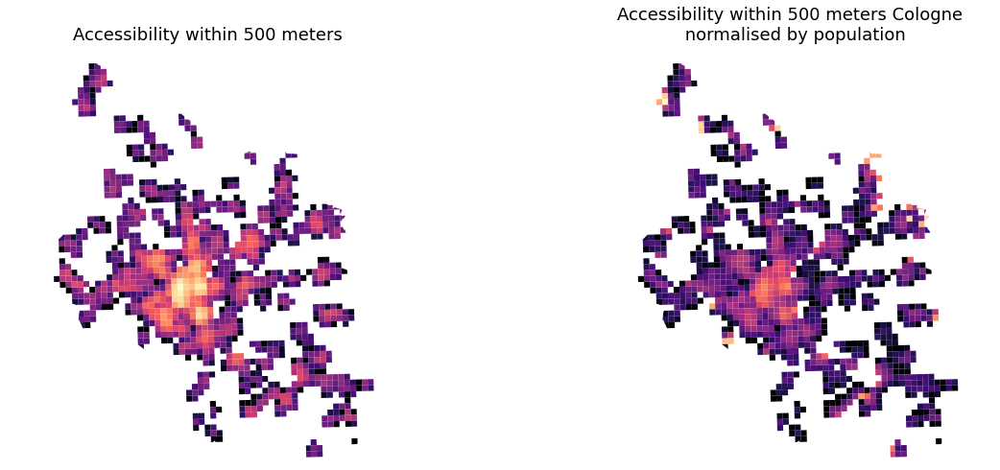

time: 1.38 s (started: 2021-08-15 10:42:28 +02:00)


In [76]:
f, ax = plt.subplots(1,2,figsize=(20,8))

polyaccess.plot(column='aggr_access', ax = ax[0], \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.aggr_access.min(), LOGMIN), \
                                   vmax=polyaccess.aggr_access.max()), \
                                    cmap='magma')   
  
ax[0].axis(polyaccess.total_bounds[np.asarray([0,2,1,3])])
ax[0].set_title("Accessibility within 500 meters", size = 18)


polyaccess.plot(column='access_normalised', ax = ax[1], \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.access_normalised.min(), 0.001), \
                                   vmax=polyaccess.access_normalised.max()), \
                                    cmap='magma')

ax[1].axis(polyaccess.total_bounds[np.asarray([0,2,1,3])])
ax[1].set_title("Accessibility within 500 meters Cologne \n normalised by population", size = 18)
ax[0].axis('off')
ax[1].axis('off')
plt.show()

In [77]:
sum(polyaccess.access_normalised)

31.38593958269844

time: 2.27 ms (started: 2021-08-15 10:42:45 +02:00)


In [80]:
#print final score
polyaccess.access_normalised.mean()

0.011417220655765167

time: 2.65 ms (started: 2021-08-15 10:45:38 +02:00)


In [79]:
polyaccess.aggr_access.mean()

1.3374240272226623

time: 2.32 ms (started: 2021-08-15 10:42:47 +02:00)


In [81]:
polyaccess.access_normalised.sum()

31.385939582698413

time: 2.23 ms (started: 2021-08-15 10:46:00 +02:00)


In [82]:
sum(polyaccess.access_normalised)

31.38593958269844

time: 87.8 ms (started: 2021-08-16 16:03:41 +02:00)
